In [168]:
using DifferentialEquations
using Plots
using Random
using LaTeXStrings
using QuadGK 

In [169]:
# Define the Duffing oscillator parameters
α = 1.0  # Linear stiffness
β = 0.0  # Nonlinear stiffness
δ = 0.0  # Damping coefficient
σ = 0.2  # Noise intensity

# Unforced system (no random forcing)
function duffing_nonforced!(du, u, p, t)
    x, v = u
    δ, α, β = p
    du[1] = v  # dx/dt = v
    du[2] = -δ * v - α * x - β * x^3  # dv/dt = -δv - αx - βx³
end

# Forced system (with random forcing)
function duffing_forced!(du, u, p, t)
    x, v = u
    δ, α, β, σ = p
    du[1] = v  # dx/dt = v
    du[2] = -δ * v - α * x - β * x^3  # dv/dt = -δv - αx - βx³
end

# Noise term for the forced system
function noise!(du, u, p, t)
    x, v = u
    δ, α, β, σ = p
    du[1] = 0.0  # No noise in the position equation
    du[2] = σ   # Add noise to the velocity equation
end

# Initial conditions
u0 = [1.0, 0.0]  # Initial displacement and velocity

# Parameters
p_nonforced = (δ, α, β)  # Parameters for the non-forced system
p_forced = (δ, α, β, σ)  # Parameters for the forced system

# Time span
tspan = (0.0, 250.0)

# Define the ODE problem (non-forced)
prob_nonforced = ODEProblem(duffing_nonforced!, u0, tspan, p_nonforced)

# Define the SDE problem (randomly forced)
prob_forced = SDEProblem(duffing_forced!, noise!, u0, tspan, p_forced)

# Solve the unforced system
sol_nonforced = solve(prob_nonforced, Tsit5(), dt=0.01, reltol=1e-8, abstol=1e-8)

# Solve the forced system
sol_forced = solve(prob_forced, SOSRI());


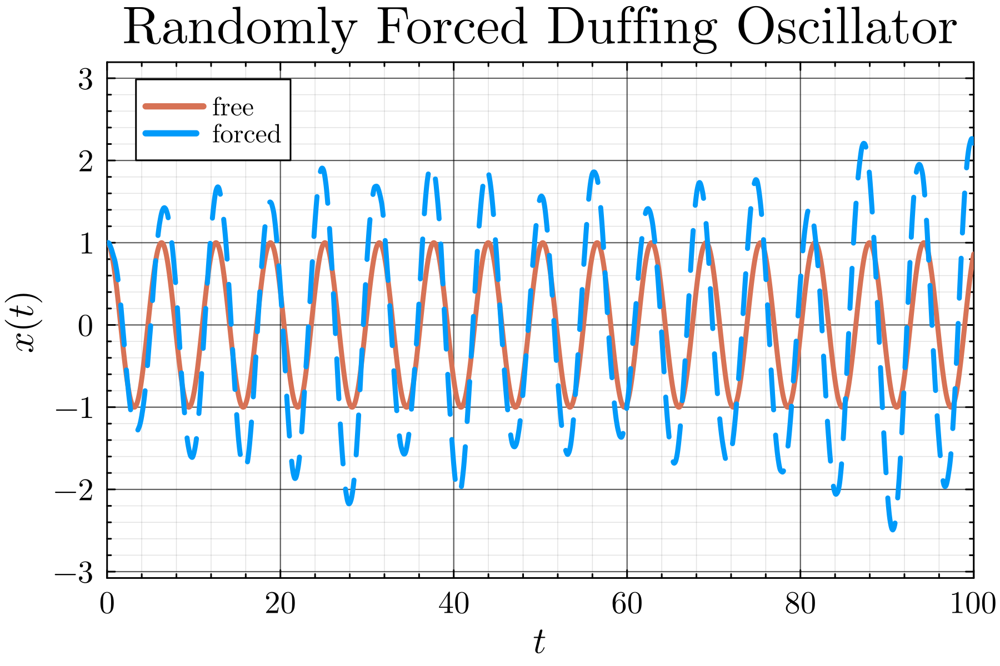

In [170]:
theme(:dao)

# Plot the solution
plot(sol_nonforced,
    line = (3, :solid),
    idxs=(0, 1),
    label="free"
    )
plot!(sol_forced,
    line = (3, :dash),
    idxs=(0, 1), 
    xlims=(0.0, 100.0),
    label="forced",
    xlabel=L"$t$", 
    ylabel=L"$x(t)$", 
    title="Randomly Forced Duffing Oscillator",
    legend=:best,
    titlefontsize=20,
    tickfontsize=12,
    legendfontsize=10,
    yguidefontsize=15,
    xguidefontsize=15,
    dpi=300,
    right_margin = 2 * Plots.mm
    )

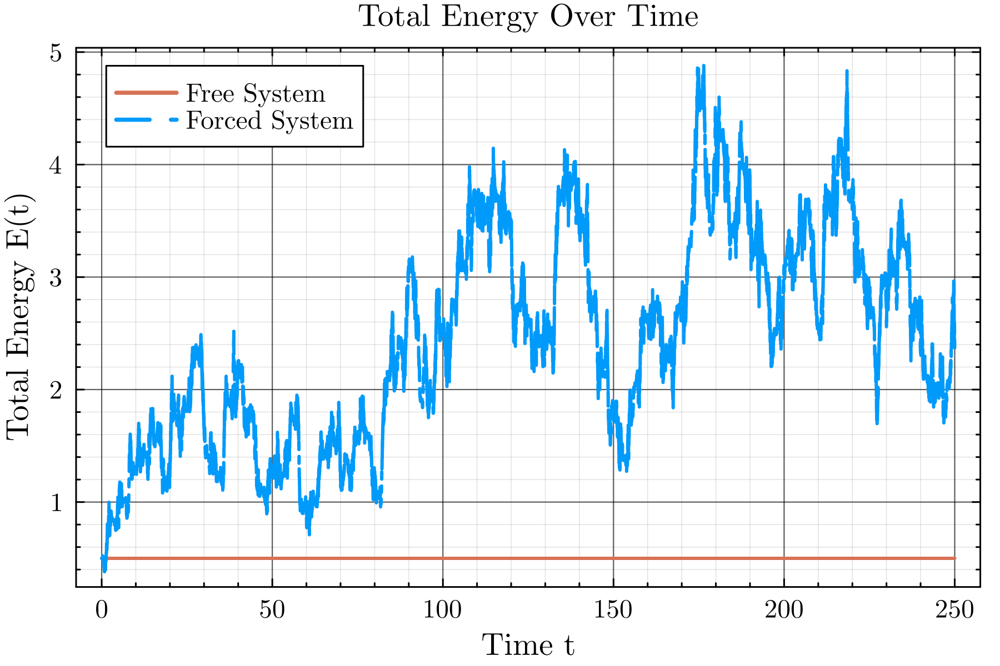

In [171]:
function total_energy(u, α, β)
      x, v = u
      kinetic = 0.5 * v^2
      potential = 0.5 * α * x^2 + 0.25 * β * x^4
      return kinetic + potential
  end

# Plot total energy over time
energy1 = [total_energy(u, α, β) for u in sol_nonforced.u]
energy2 = [total_energy(u, α, β) for u in sol_forced.u]
plot(sol_nonforced.t, energy1, label="Free System", line=(2, :solid))
plot!(sol_forced.t, energy2, label="Forced System", line=(2, :dash), legend=:best,
      title="Total Energy Over Time", xlabel="Time t", ylabel="Total Energy E(t)",
      titlefontsize=12, tickfontsize=10, legendfontsize=10, dpi=300)

In [172]:
# Compute mean energy over the time domain
function mean_energy(sol, α, β)
    # Extract time and energy values
    t = sol.t
    energy = [total_energy(u, α, β) for u in sol.u]

    # Compute the mean energy using numerical integration
    mean_E = quadgk(t -> total_energy(sol(t), α, β), t[1], t[end])[1] / (t[end] - t[1])
    return mean_E
end

# Compute mean energy for the unforced system
mean_energy_nonforced = mean_energy(sol_nonforced, α, β)

# Compute mean energy for the forced system
mean_energy_forced = mean_energy(sol_forced, α, β)

# Print results
println("Mean Energy (Free System): ", mean_energy_nonforced)
println("Mean Energy (Forced System): ", mean_energy_forced)

Mean Energy (Free System): 0.4999999575641109
Mean Energy (Forced System): 2.4367249782281095


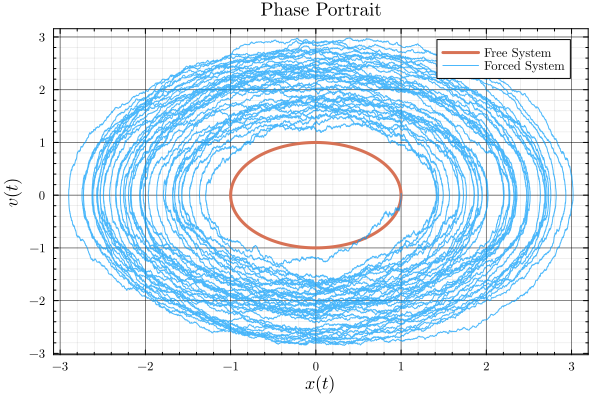

In [173]:
# Plot phase portraits
x1 = [u[1] for u in sol_nonforced.u]
v1 = [u[2] for u in sol_nonforced.u]
x2 = [u[1] for u in sol_forced.u]
v2 = [u[2] for u in sol_forced.u]

plot(x1, v1, xlabel=L"$x(t)$", ylabel=L"$v(t)$", title="Phase Portrait", label="Free System", linewidth=3, alpha=1)
plot!(x2, v2, label="Forced System", linewidth=1, alpha=0.7, legend=:best)
#scatter!([x1[1]], [v1[1]], label="Start (Free)", color=:red, markersize=3)
#scatter!([x2[1]], [v2[1]], label="Start (Forced)", color=:blue, markersize=3)